In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [4]:
input_file =  '/content/drive/MyDrive/ColabNotebooks/Lab-5/archive.zip'
output_folder = '/content/drive/MyDrive/ColabNotebooks/Lab-5/'

print(f"Input file path: {input_file}")
print(f"Output folder path: {output_folder}")
# !unzip {input_file} -d {output_folder} # Do this only once, them comment out this command

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/ColabNotebooks/Lab-5/Data/train/COVID19/COVID19(228).jpg  
  inflating: /content/drive/MyDrive/ColabNotebooks/Lab-5/Data/train/COVID19/COVID19(229).jpg  
  inflating: /content/drive/MyDrive/ColabNotebooks/Lab-5/Data/train/COVID19/COVID19(23).jpg  
  inflating: /content/drive/MyDrive/ColabNotebooks/Lab-5/Data/train/COVID19/COVID19(230).jpg  
  inflating: /content/drive/MyDrive/ColabNotebooks/Lab-5/Data/train/COVID19/COVID19(231).jpg  
  inflating: /content/drive/MyDrive/ColabNotebooks/Lab-5/Data/train/COVID19/COVID19(232).jpg  
  inflating: /content/drive/MyDrive/ColabNotebooks/Lab-5/Data/train/COVID19/COVID19(233).jpg  
  inflating: /content/drive/MyDrive/ColabNotebooks/Lab-5/Data/train/COVID19/COVID19(234).jpg  
  inflating: /content/drive/MyDrive/ColabNotebooks/Lab-5/Data/train/COVID19/COVID19(235).jpg  
  inflating: /content/drive/MyDrive/ColabNotebooks/Lab-5/Data/train/COVID19/COVID19(236).jpg  


In [5]:
import os
import random
import numpy as np
import torch as tc
import torchvision as tv
import pandas as pd
import matplotlib.pyplot as plt
!pip install SimpleITK
import SimpleITK as sitk
from torch.utils.tensorboard import SummaryWriter

data_path = os.path.join(output_folder, "Data")
path_to_training_set = os.path.join(data_path, "train")
path_to_testing_set = os.path.join(data_path, "test")
print(f"Folders within training folder: {os.listdir(path_to_training_set)}")
print(f"Folders within testing folder: {os.listdir(path_to_testing_set)}")


training_set = []
for folder_name in os.listdir(path_to_training_set):
    for case_name in os.listdir(os.path.join(path_to_training_set, folder_name)):
        current_case = (os.path.join("train", folder_name, case_name), folder_name)
        training_set.append(current_case)

testing_set = []
for folder_name in os.listdir(path_to_testing_set):
    for case_name in os.listdir(os.path.join(path_to_testing_set, folder_name)):
        current_case = (os.path.join("test", folder_name, case_name), folder_name)
        testing_set.append(current_case)

random.seed(666)
random.shuffle(training_set)
random.shuffle(testing_set)

print("Training cases: ")
print(training_set[:15])

print("Testing cases: ")
print(testing_set[:15])

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.7/52.7 MB 11.5 MB/s eta 0:00:00
Folders within training folder: ['COVID19', 'NORMAL', 'PNEUMONIA']
Folders within testing folder: ['COVID19', 'NORMAL', 'PNEUMONIA']
Training cases: 
[('train/COVID19/COVID19(302).jpg', 'COVID19'), ('train/PNEUMONIA/PNEUMONIA(1214).jpg', 'PNEUMONIA'), ('train/NORMAL/NORMAL(662).jpg', 'NORMAL'), ('train/PNEUMONIA/PNEUMONIA(995).jpg', 'PNEUMONIA'), ('train/PNEUMONIA/PNEUMONIA(2902).jpg', 'PNEUMONIA'), ('train/PNEUMONIA/PNEUMONIA(2821).jpg', 'PNEUMONIA'), ('train/PNEUMONIA/PNEUMONIA(1566).jpg', 'PNEUMONIA'), ('train/PNEUMONIA/PNEUMONIA(1559).jpg', 'PNEUMONIA'), ('train/PNEUMONIA/PNEUMONIA(1401).jpg', 'PNEUMONIA'), ('train/PNEUMONIA/PNEUMONIA(1548).jpg', 'PNEUMONIA'), ('train/NORMAL/NORMAL(177).jpg', 'NORMAL'), ('train/COVID19/COVID19(120).jpg', 'COVID19'), ('train/NORMAL/NORMAL(316).jpg', 'NORMAL'), ('train/PNEUMONIA/PNEUMONIA(3003).jpg', 'PNEUMONIA'), ('train/NORMAL/NORMAL(102).jpg', 'NORMAL')]
Testing cases

In [6]:
training_validation_df = pd.DataFrame(training_set, columns=["Image Path", "Class"])
testing_df = pd.DataFrame(testing_set, columns=["Image Path", "Class"])

print(f"Training/Validation DataFrame size: {len(training_validation_df)}")
print(f"Testing DataFrame size: {len(testing_df)}")

split_ratio = 0.9
train_size = int(len(training_validation_df) * split_ratio)
training_df = training_validation_df[:train_size]
validation_df = training_validation_df[train_size:]

print(f"Training DataFrame size: {len(training_df)}")
print(f"Validation DataFrame size: {len(validation_df)}")

training_csv_path = os.path.join(data_path, "training.csv")
validation_csv_path = os.path.join(data_path, "validation.csv")
testing_csv_path = os.path.join(data_path, "testing.csv")

training_df.to_csv(training_csv_path, index=False)
validation_df.to_csv(validation_csv_path, index=False)
testing_df.to_csv(testing_csv_path, index=False)

training_df = pd.read_csv(training_csv_path)
print(f"Training class distribution: ")
print(training_df['Class'].value_counts())

validation_df = pd.read_csv(validation_csv_path)
print(f"Validation class distribution: ")
print(validation_df['Class'].value_counts())

testing_df = pd.read_csv(testing_csv_path)
print(f"Testing class distribution: ")
print(testing_df['Class'].value_counts())

Training/Validation DataFrame size: 5144
Testing DataFrame size: 1288
Training DataFrame size: 4629
Validation DataFrame size: 515
Training class distribution: 
Class
PNEUMONIA    3060
NORMAL       1154
COVID19       415
Name: count, dtype: int64
Validation class distribution: 
Class
PNEUMONIA    358
NORMAL       112
COVID19       45
Name: count, dtype: int64
Testing class distribution: 
Class
PNEUMONIA    855
NORMAL       317
COVID19      116
Name: count, dtype: int64


In [49]:
import os
import pandas as pd
import torch as tc
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms as T
from PIL import Image
import matplotlib.pyplot as plt

class XRayDataset(tc.utils.data.Dataset):
    def __init__(self, dataset_path, csv_path, class_mapper, transform=None):
        self.dataset_path = dataset_path
        self.csv_path = csv_path
        self.dataframe = pd.read_csv(self.csv_path)
        self.class_mapper = class_mapper
        self.transform = transform


    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        current_case = self.dataframe.iloc[idx]
        current_path = os.path.join(self.dataset_path, current_case['Image Path'])
        current_class = current_case['Class']

        current_image = Image.open(current_path).convert('RGB')

        if self.transform:
            current_image = self.transform(current_image)

        class_number = self.class_mapper[current_class]

        return current_image, class_number



Training dataset size: 4629


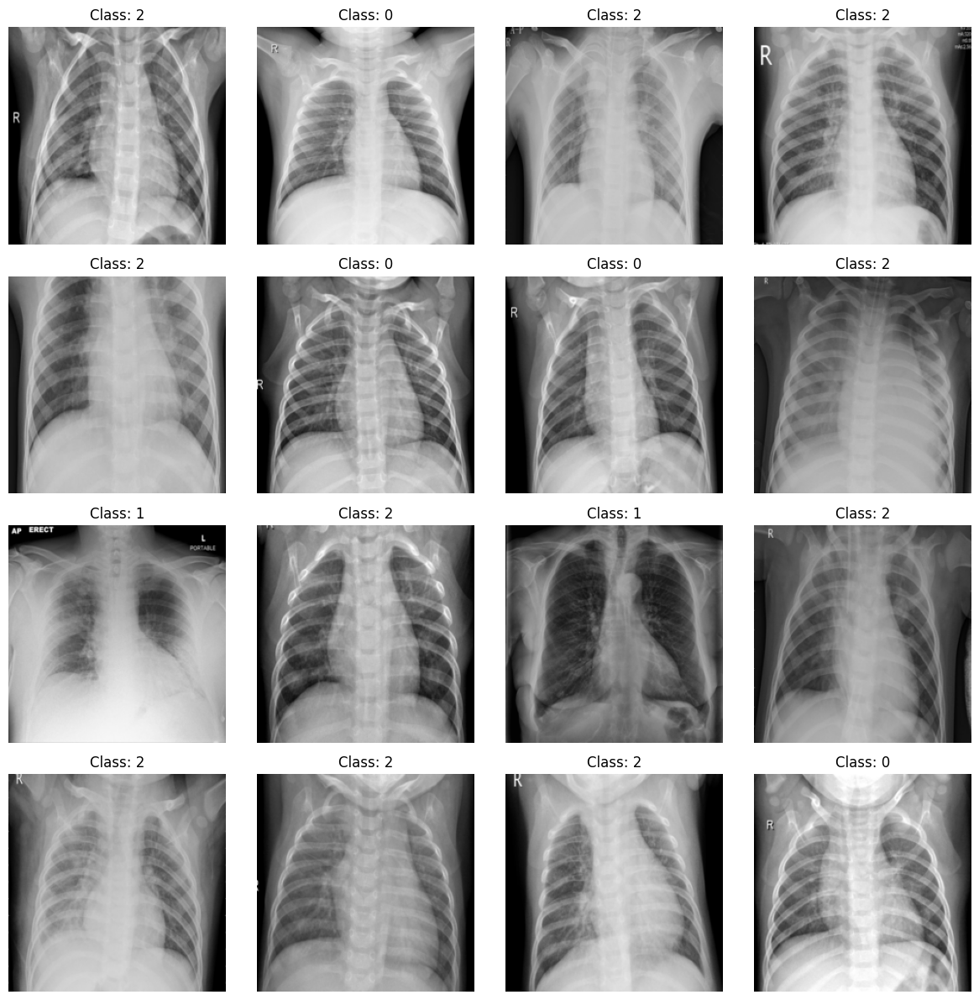

In [50]:

batch_size = 16
shuffle = True
class_mapper = {'NORMAL': 0, "COVID19": 1, "PNEUMONIA": 2}

data_path = '/content/drive/MyDrive/ColabNotebooks/Lab-5/Data'
training_csv_path = os.path.join(data_path, "training.csv")

transform = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor()
])

training_dataset = XRayDataset(dataset_path=data_path, csv_path=training_csv_path, class_mapper=class_mapper, transform=transform)
training_dataloader = DataLoader(training_dataset, batch_size=batch_size, shuffle=shuffle)

print(f"Training dataset size: {len(training_dataset)}")

for images, classes in training_dataloader:
    fig, axs = plt.subplots(4, 4, figsize=(12, 12))
    for i in range(batch_size):
        row = i // 4
        col = i % 4
        img = images[i].permute(1, 2, 0).numpy()
        axs[row, col].imshow(img)
        axs[row, col].set_title(f'Class: {classes[i].item()}')
        axs[row, col].axis('off')
    plt.tight_layout()
    plt.show()
    break


In [60]:
class XRayDataset(tc.utils.data.Dataset):
    def __init__(self, dataset_path, csv_path, class_mapper, transforms=None, z_norm=False):
        self.dataset_path = dataset_path
        self.csv_path = csv_path
        self.dataset_path = dataset_path
        self.dataframe = pd.read_csv(self.csv_path)
        self.class_mapper = class_mapper
        self.transforms = transforms
        self.z_norm = z_norm

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        current_case = self.dataframe.iloc[idx]
        current_path = os.path.join(self.dataset_path, current_case['Image Path'])
        current_class = current_case['Class']

        current_image = Image.open(current_path).convert('RGB')

        if self.transforms:
            current_image = self.transforms(current_image)

        if self.z_norm:
            mean = current_image.mean()
            std = current_image.std()
            current_image = (current_image - mean) / std

        class_number = self.class_mapper[current_class]

        return current_image, class_number

Training dataset size: 4629


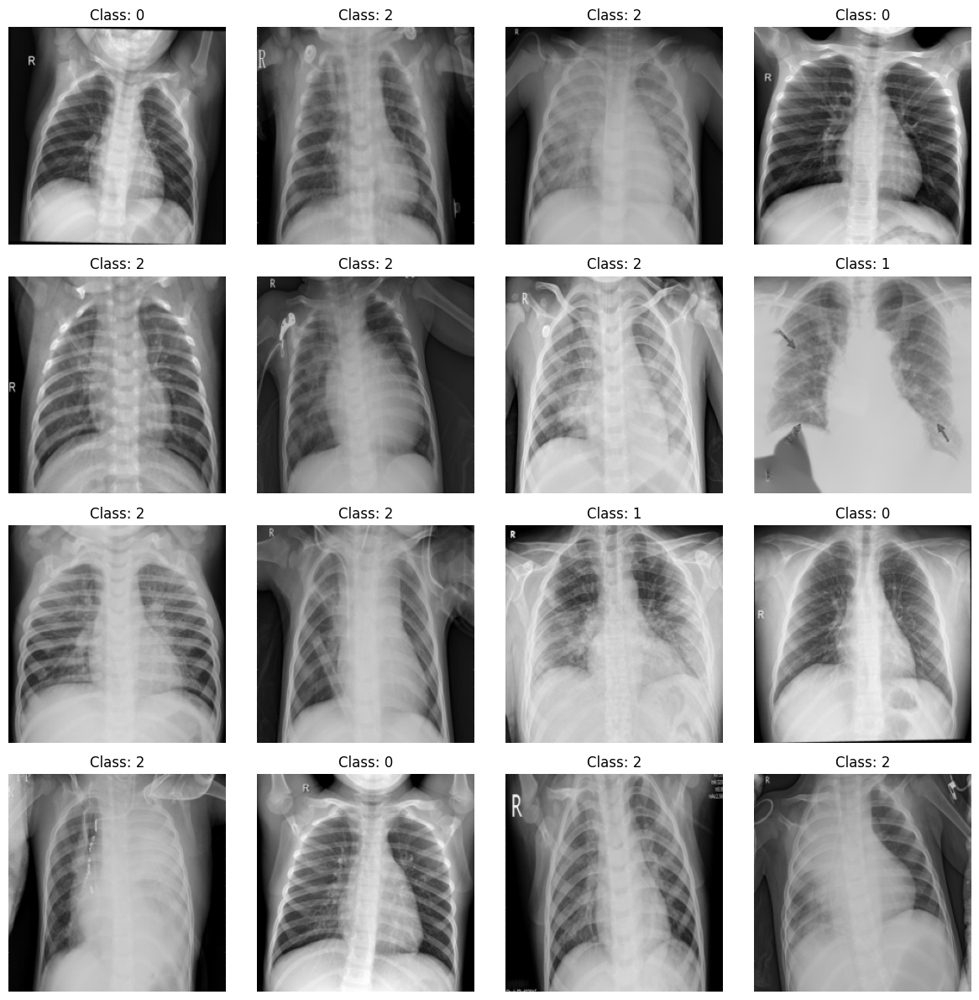

In [62]:
import os
import torch
import torchvision.transforms as T
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

batch_size = 16
shuffle = True
class_mapping = {'NORMAL': 0, "COVID19": 1, "PNEUMONIA": 2}

data_path = '/content/drive/MyDrive/ColabNotebooks/Lab-5/Data'
training_csv_path = os.path.join(data_path, "training.csv")

transform = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor()  # Convert to tensor
])


training_dataset = XRayDataset(dataset_path=data_path, csv_path=training_csv_path, class_mapper=class_mapping, transforms=transform)
training_dataloader = DataLoader(training_dataset, batch_size=batch_size, shuffle=shuffle)

print(f"Training dataset size: {len(training_dataset)}")

for images, classes in training_dataloader:
    fig, axs = plt.subplots(4, 4, figsize=(12, 12))
    for i in range(batch_size):
        row = i // 4
        col = i % 4
        img = images[i].permute(1, 2, 0).numpy()
        axs[row, col].imshow(img)
        axs[row, col].set_title(f'Class: {classes[i].item()}')
        axs[row, col].axis('off')
    plt.tight_layout()
    plt.show()
    break


In [63]:
import torch
import torchvision.models as models

device = "cuda:0" if torch.cuda.is_available() else "cpu"

model_from_scratch = models.resnet18(num_classes=len(class_mapper)).to(device)

model_pretrained_all = models.resnet18(pretrained=True).to(device)
num_ftrs = model_pretrained_all.fc.in_features
model_pretrained_all.fc = torch.nn.Linear(num_ftrs, len(class_mapper)).to(device)

model_pretrained_final = models.resnet18(pretrained=True).to(device)
for param in model_pretrained_final.parameters():
    param.requires_grad = False
num_ftrs = model_pretrained_final.fc.in_features
model_pretrained_final.fc = torch.nn.Linear(num_ftrs, len(class_mapper)).to(device)

for images, classes in training_dataloader:
    images = images.to(device)
    output = model_from_scratch(images)
    print(f"Output: {torch.sigmoid(output)}")
    print(f"Classes: {classes}")
    break

for images, classes in training_dataloader:
    images = images.to(device)
    output = model_pretrained_final(images)
    print(f"Output: {torch.sigmoid(output)}")
    print(f"Classes: {classes}")
    break


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Output: tensor([[0.4647, 0.5756, 0.7720],
        [0.4635, 0.5449, 0.7597],
        [0.4733, 0.5773, 0.7614],
        [0.4701, 0.5548, 0.7694],
        [0.3764, 0.6950, 0.8449],
        [0.4838, 0.5467, 0.7180],
        [0.4883, 0.5581, 0.7367],
        [0.4784, 0.6154, 0.8459],
        [0.4911, 0.5436, 0.7324],
        [0.4896, 0.6097, 0.7747],
        [0.4776, 0.5476, 0.7333],
        [0.3387, 0.6867, 0.8784],
        [0.3816, 0.6125, 0.8006],
        [0.4522, 0.5548, 0.7790],
        [0.4630, 0.5858, 0.7806],
        [0.4764, 0.5729, 0.7657]], device='cuda:0', grad_fn=<SigmoidBackward0>)
Classes: tensor([2, 2, 2, 2, 0, 2, 2, 0, 2, 2, 2, 0, 0, 2, 2, 2])
Output: tensor([[0.6001, 0.4492, 0.5270],
        [0.6988, 0.3590, 0.3798],
        [0.8026, 0.3672, 0.4392],
        [0.6350, 0.3893, 0.5416],
        [0.6415, 0.4570, 0.4927],
        [0.6327, 0.4530, 0.5849],
        [0.6052, 0.3631, 0.5757],
        [0.6265, 0.2736, 0.7678],
        [0.6141, 0.4210, 0.5074],
        [0.7349, 0.568

In [70]:
import torch as tc
import torch.nn as nn
import torch.optim as optim
from torch.utils.tensorboard import SummaryWriter

def training(model, learning_rate, num_epochs, writer, training_dataloader, validation_dataloader):
    device = "cuda:0" if tc.cuda.is_available() else "cpu"
    model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in training_dataloader:
            images, labels = images.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            _, predicted = tc.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            running_loss += loss.item()

        train_loss = running_loss / len(training_dataloader)

        model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0

        with tc.no_grad():
            for images, labels in validation_dataloader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                _, predicted = tc.max(outputs, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()
                val_loss += loss.item()

        val_loss /= len(validation_dataloader)

        print(f'Epoch [{epoch+1}/{num_epochs}], '
              f'Train Loss: {train_loss:.4f}, '
              f'Val Loss: {val_loss:.4f}')

        writer.add_scalar('Loss/train', train_loss, epoch)
        writer.add_scalar('Loss/validation', val_loss, epoch)


learning_rate = 0.002
batch_size = 16
num_epochs = 20
shuffle = True
transforms = T.Compose([
    T.Resize((224, 224)),
    T.ToTensor()  # Convert to tensor
])
training_dataset = XRayDataset(data_path, training_csv_path, class_mapper, transforms=transforms, z_norm=True)
training_dataloader = tc.utils.data.DataLoader(training_dataset, batch_size=batch_size, shuffle=shuffle)

validation_dataset = XRayDataset(data_path, validation_csv_path, class_mapper, transforms=transforms, z_norm=True)
validation_dataloader = tc.utils.data.DataLoader(validation_dataset, batch_size=batch_size, shuffle=False)

testing_dataset = XRayDataset(data_path, testing_csv_path, class_mapper, transforms=transforms, z_norm=True)
testing_dataloader = tc.utils.data.DataLoader(testing_dataset, batch_size=batch_size, shuffle=False)

writer = SummaryWriter()

training(model_from_scratch, learning_rate, num_epochs, writer, training_dataloader, validation_dataloader)


Epoch [1/20], Train Loss: 0.2264, Val Loss: 0.1883
Epoch [2/20], Train Loss: 0.1742, Val Loss: 0.1414
Epoch [3/20], Train Loss: 0.1518, Val Loss: 0.1601
Epoch [4/20], Train Loss: 0.1369, Val Loss: 0.1674
Epoch [5/20], Train Loss: 0.1151, Val Loss: 0.1424
Epoch [6/20], Train Loss: 0.1027, Val Loss: 0.1142
Epoch [7/20], Train Loss: 0.0997, Val Loss: 0.1767
Epoch [8/20], Train Loss: 0.0897, Val Loss: 0.1273
Epoch [9/20], Train Loss: 0.0776, Val Loss: 0.3073
Epoch [10/20], Train Loss: 0.0573, Val Loss: 0.1382
Epoch [11/20], Train Loss: 0.0533, Val Loss: 0.1528
Epoch [12/20], Train Loss: 0.0621, Val Loss: 0.1438
Epoch [13/20], Train Loss: 0.0398, Val Loss: 0.1961
Epoch [14/20], Train Loss: 0.0276, Val Loss: 0.2054
Epoch [15/20], Train Loss: 0.0255, Val Loss: 0.1775
Epoch [16/20], Train Loss: 0.0247, Val Loss: 0.2160
Epoch [17/20], Train Loss: 0.0230, Val Loss: 0.1893
Epoch [18/20], Train Loss: 0.0064, Val Loss: 0.1926
Epoch [19/20], Train Loss: 0.0203, Val Loss: 0.2400
Epoch [20/20], Train 

In [77]:
# !pip install tensorboard
%load_ext tensorboard
writer = SummaryWriter(log_dir='./runs/May29_06-02-30_4a2b94e54137')
%tensorboard --logdir ./runs


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

I did not implement the training for other models because there is not a free usage for GPU. Using GCP is possible only with creating a billing account and attaching a credit car.

In [96]:
def accumulate_predictions_and_scores(model, dataloader):
    predictions = []
    targets = []
    scores = []

    model.eval()

    for images, labels in dataloader:
        images, labels = images.to(device), labels.to(device)

        with tc.no_grad():
            outputs = model(images)

        probabilities = tc.nn.functional.softmax(outputs, dim=1)

        _, predicted = tc.max(outputs, 1)

        predictions.extend(predicted.cpu().detach().numpy())
        targets.extend(labels.cpu().detach().numpy())
        scores.extend(probabilities.cpu().detach().numpy())

    return predictions, targets, scores

scratch_predictions, scratch_targets, scratch_scores = accumulate_predictions_and_scores(model_from_scratch, testing_dataloader)
finetuned_all_predictions, finetuned_all_targets, finetuned_all_scores = accumulate_predictions_and_scores(model_pretrained_all, testing_dataloader)
finetuned_last_predictions, finetuned_last_targets, finetuned_last_scores = accumulate_predictions_and_scores(model_pretrained_final, testing_dataloader)


Confusion matrix: From Scratch:
[[207   0 110]
 [ 15  37  64]
 [ 15   0 840]]
              precision    recall  f1-score   support

      Normal       0.87      0.65      0.75       317
     COVID19       1.00      0.32      0.48       116
   Pneumonia       0.83      0.98      0.90       855

    accuracy                           0.84      1288
   macro avg       0.90      0.65      0.71      1288
weighted avg       0.85      0.84      0.82      1288


Confusion matrix: All Layers:
[[267   3  47]
 [  0 111   5]
 [  8   1 846]]
              precision    recall  f1-score   support

      Normal       0.97      0.84      0.90       317
     COVID19       0.97      0.96      0.96       116
   Pneumonia       0.94      0.99      0.97       855

    accuracy                           0.95      1288
   macro avg       0.96      0.93      0.94      1288
weighted avg       0.95      0.95      0.95      1288


Confusion matrix: Last Layer:
[[ 17   0 300]
 [ 58   1  57]
 [370   0 485]]
      

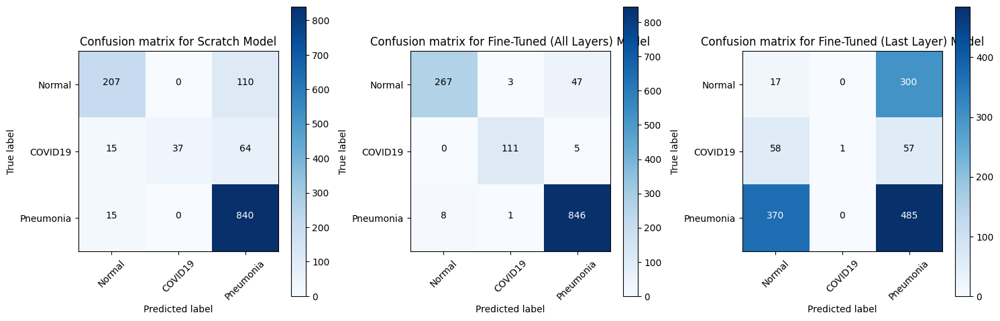

In [101]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn.metrics as metrics
import itertools


def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()


target_names = ["Normal", "COVID19", "Pneumonia"]

cm_scratch = metrics.confusion_matrix(scratch_targets, scratch_predictions)
cm_finetuned_all = metrics.confusion_matrix(finetuned_all_targets, finetuned_all_predictions)
cm_finetuned_last = metrics.confusion_matrix(finetuned_last_targets, finetuned_last_predictions)

print("Confusion matrix: From Scratch:")
print(cm_scratch)
print(metrics.classification_report(scratch_targets, scratch_predictions, target_names=target_names))

print("\nConfusion matrix: All Layers:")
print(cm_finetuned_all)
print(metrics.classification_report(finetuned_all_targets, finetuned_all_predictions, target_names=target_names))

print("\nConfusion matrix: Last Layer:")
print(cm_finetuned_last)
print(metrics.classification_report(finetuned_last_targets, finetuned_last_predictions, target_names=target_names))


plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plot_confusion_matrix(cm_scratch, classes=target_names, title='Confusion matrix for Scratch Model')

plt.subplot(1, 3, 2)
plot_confusion_matrix(cm_finetuned_all, classes=target_names, title='Confusion matrix for Fine-Tuned (All Layers) Model')

plt.subplot(1, 3, 3)
plot_confusion_matrix(cm_finetuned_last, classes=target_names, title='Confusion matrix for Fine-Tuned (Last Layer) Model')

plt.show()



NORMAL from scratch AUC: 0.9450369874629232
COVID19 from scratch AUC: 0.9803901376956572
PNEUMONIA from scratch AUC: 0.9509501235768403


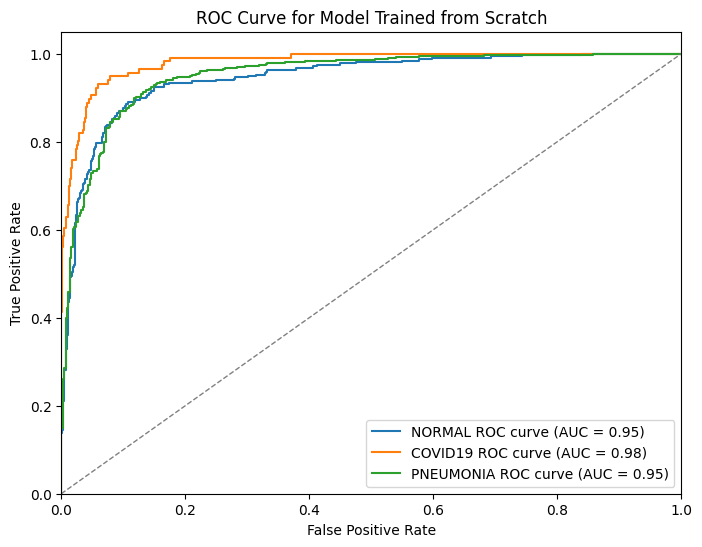

In [107]:
scratch_targets = np.array(scratch_targets)
scratch_scores = np.array(scratch_scores)

fpr_scratch = {}
tpr_scratch = {}
auc_scratch = {}
for i in range(len(class_mapper)):
    fpr_scratch[i], tpr_scratch[i], _ = metrics.roc_curve(scratch_targets == i, scratch_scores[:, i])
    auc_scratch[i] = metrics.auc(fpr_scratch[i], tpr_scratch[i])

for i, class_name in enumerate(class_mapper):
    print(f"{class_name} from scratch AUC: {auc_scratch[i]}")

plt.figure(figsize=(8, 6))
for i, class_name in enumerate(class_mapper):
    plt.plot(fpr_scratch[i], tpr_scratch[i], label=f'{class_name} ROC curve (AUC = {auc_scratch[i]:.2f})')

plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Model Trained from Scratch')
plt.legend(loc='lower right')
plt.show()

NORMAL from fine-tuned (all layers) AUC: 0.9915986316100673
COVID19 from fine-tuned (all layers) AUC: 0.9994851123926092
PNEUMONIA from fine-tuned (all layers) AUC: 0.9925772861715491


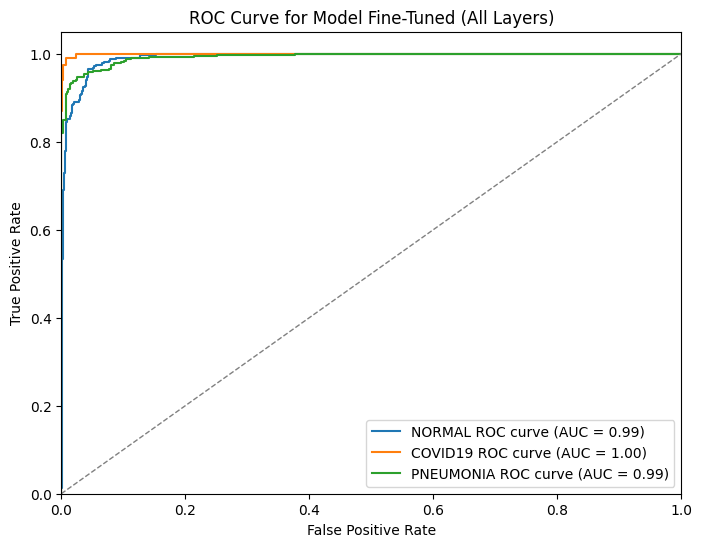

In [110]:
finetuned_all_targets = np.array(finetuned_all_targets)
finetuned_all_scores = np.array(finetuned_all_scores)

fpr_finetuned_all = {}
tpr_finetuned_all = {}
auc_finetuned_all = {}
for i in range(len(class_mapper)):
    fpr_finetuned_all[i], tpr_finetuned_all[i], _ = metrics.roc_curve(finetuned_all_targets == i, finetuned_all_scores[:, i])
    auc_finetuned_all[i] = metrics.auc(fpr_finetuned_all[i], tpr_finetuned_all[i])

for i, class_name in enumerate(class_mapper):
    print(f"{class_name} from fine-tuned (all layers) AUC: {auc_finetuned_all[i]}")

plt.figure(figsize=(8, 6))
for i, class_name in enumerate(class_mapper):
    plt.plot(fpr_finetuned_all[i], tpr_finetuned_all[i], label=f'{class_name} ROC curve (AUC = {auc_finetuned_all[i]:.2f})')

plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Model Fine-Tuned (All Layers)')
plt.legend(loc='lower right')
plt.show()

NORMAL from fine-tuned (last layer) AUC: 0.16574671791089873
COVID19 from fine-tuned (last layer) AUC: 0.5467591502883371
PNEUMONIA from fine-tuned (last layer) AUC: 0.31594073713922993


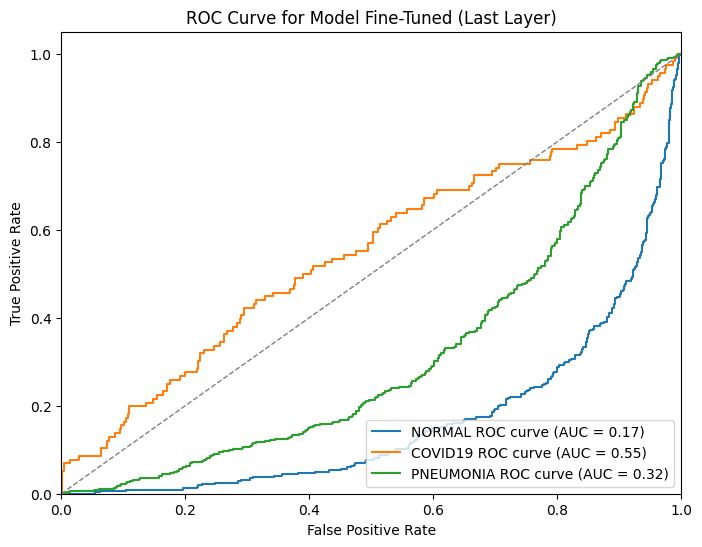

In [111]:
finetuned_last_targets = np.array(finetuned_last_targets)
finetuned_last_scores = np.array(finetuned_last_scores)

fpr_finetuned_last = {}
tpr_finetuned_last = {}
auc_finetuned_last = {}
for i in range(len(class_mapper)):
    fpr_finetuned_last[i], tpr_finetuned_last[i], _ = metrics.roc_curve(finetuned_last_targets == i, finetuned_last_scores[:, i])
    auc_finetuned_last[i] = metrics.auc(fpr_finetuned_last[i], tpr_finetuned_last[i])

for i, class_name in enumerate(class_mapper):
    print(f"{class_name} from fine-tuned (last layer) AUC: {auc_finetuned_last[i]}")

plt.figure(figsize=(8, 6))
for i, class_name in enumerate(class_mapper):
    plt.plot(fpr_finetuned_last[i], tpr_finetuned_last[i], label=f'{class_name} ROC curve (AUC = {auc_finetuned_last[i]:.2f})')

plt.plot([0, 1], [0, 1], color='gray', lw=1, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Model Fine-Tuned (Last Layer)')
plt.legend(loc='lower right')
plt.show()